In [12]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

Recebendo inputs do kaggle e separando em pastas

In [13]:
import os

# Caminhos para as pastas
train_color_dir = "img/train_color"
train_gray_dir = "img/train_gray"
val_color_dir = "img/val_color"
val_gray_dir = "img/val_gray"

# Função para criar pastas, se elas não existirem
def create_folders():
    os.makedirs(train_color_dir, exist_ok=True)
    os.makedirs(train_gray_dir, exist_ok=True)
    os.makedirs(val_color_dir, exist_ok=True)
    os.makedirs(val_gray_dir, exist_ok=True)

# Criar pastas
create_folders()

print("Pastas criadas com sucesso!")


Pastas criadas com sucesso!


In [14]:

import os
import shutil
from sklearn.model_selection import train_test_split

# Caminhos para as pastas
color_dir = "landscape Images/color"
gray_dir = "landscape Images/gray"
train_color_dir = "img/train_color"
train_gray_dir = "img/train_gray"
val_color_dir = "img/val_color"
val_gray_dir = "img/val_gray"

# Listar imagens (assumindo que os pares têm o mesmo nome de arquivo)
color_images = sorted(os.listdir(color_dir))
gray_images = sorted(os.listdir(gray_dir))

# Extraindo nomes dos arquivos (sem a extensão)
image_names = [os.path.splitext(img)[0] for img in color_images]

# Dividir em treino e validação (usando 20% para validação, por exemplo)
train_names, val_names = train_test_split(image_names, test_size=0.15, random_state=42)

# Função para mover arquivos
def copy_images(image_names, src_color_dir, src_gray_dir, dst_color_dir, dst_gray_dir):
    for name in image_names:
        shutil.copy(os.path.join(src_color_dir, f"{name}.jpg"), os.path.join(dst_color_dir, f"{name}.jpg"))
        shutil.copy(os.path.join(src_gray_dir, f"{name}.jpg"), os.path.join(dst_gray_dir, f"{name}.jpg"))

# Mover os arquivos
copy_images(train_names, color_dir, gray_dir, train_color_dir, train_gray_dir)
copy_images(val_names, color_dir, gray_dir, val_color_dir, val_gray_dir)

print("Imagens copiadas com sucesso!")


Imagens copiadas com sucesso!


Importando dependências

In [15]:
# Importe pacotes

import os
import cv2
import numpy as np
import pandas as pd
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import random
import shutil

Preparando imagens

In [16]:
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image

# Definindo transformações para as imagens
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Redimensiona as imagens para um tamanho fixo
    transforms.ToTensor()  # Converte as imagens para tensores
])

# Classe customizada para carregar as imagens
class CustomDataset(Dataset):
    def __init__(self, gray_dir, color_dir, image_names, transform=None):
        self.gray_dir = gray_dir
        self.color_dir = color_dir
        self.image_names = image_names
        self.transform = transform

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, idx):
        gray_image_path = os.path.join(self.gray_dir, f"{self.image_names[idx]}.jpg")
        color_image_path = os.path.join(self.color_dir, f"{self.image_names[idx]}.jpg")

        gray_image = Image.open(gray_image_path).convert("L")
        color_image = Image.open(color_image_path).convert("RGB")

        if self.transform:
            gray_image = self.transform(gray_image)
            color_image = self.transform(color_image)

        return gray_image, color_image

# Criando datasets
train_dataset = CustomDataset(train_gray_dir, train_color_dir, train_names, transform=transform)
val_dataset = CustomDataset(val_gray_dir, val_color_dir, val_names, transform=transform)

# Criando DataLoaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=0, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=True, num_workers=0, pin_memory=True)

print("DataLoaders criados com sucesso!")

DataLoaders criados com sucesso!


Definindo Gerador

In [17]:
# U-Net

import torch
import torch.nn as nn
import torch.nn.functional as F

class UNet(nn.Module):
    def __init__(self, image_dim, n_channels=64, depth=5, conv_kernel_size=3, conv_stride=1, conv_padding=1, pool_kernel_size=2, pool_stride=2, pool_padding=0, transpose_kernel_size=3, transpose_stride=2, transpose_padding=1):
        super(UNet, self).__init__()

        self.image_dim = image_dim  # Dimensões da imagem de entrada (C, H, W)
        self.depth = depth 
        self.n_channels = n_channels
        self.conv_kernel_size = conv_kernel_size
        self.conv_stride = conv_stride
        self.conv_padding = conv_padding
        self.pool_kernel_size = pool_kernel_size
        self.pool_stride = pool_stride
        self.pool_padding = pool_padding
        self.transpose_kernel_size = transpose_kernel_size
        self.transpose_stride = transpose_stride
        self.transpose_padding = transpose_padding
        
        # To RGB
        self.to_rgb = nn.Conv2d(1, 3, kernel_size=1)

        # Encoder
        self.encoders = nn.ModuleList([self.conv_block(3 if i == 0 else self.n_channels * (2 ** (i-1)), self.n_channels * (2 ** i)) for i in range(self.depth)])
        self.pool = nn.MaxPool2d(kernel_size=self.pool_kernel_size, stride=self.pool_stride, padding=self.pool_padding)

        # Bottleneck
        self.bottleneck = self.conv_block(self.n_channels * (2 ** (self.depth-1)), self.n_channels * (2 ** self.depth))

        # Decoder
        self.decoders = nn.ModuleList([self.conv_transpose(self.n_channels * (2 ** (i+2)), self.n_channels * (2 ** i)) for i in range(self.depth-2, -1, -1)])

        # Final conv layer
        self.final_conv = nn.Conv2d(self.n_channels, 3, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        # Camada convolucional com normalização e função de ativação; 2 vezes
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=self.conv_kernel_size, stride=self.conv_stride, padding=self.conv_padding),
            nn.BatchNorm2d(out_channels),  # Normalização para acelerar o treinamento
            nn.ReLU(inplace=True),  # Função de ativação (zera os valores negativos)
            nn.Conv2d(out_channels, out_channels, kernel_size=self.conv_kernel_size, stride=self.conv_stride, padding=self.conv_padding),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def crop(self, encoder_feature, decoder_feature):
        _, _, h, w = decoder_feature.size()
        encoder_feature = F.interpolate(encoder_feature, size=(h, w), mode='bilinear', align_corners=False)  # Redimensiona a feature map do encoder
        return encoder_feature

    def conv_transpose(self, in_channels, out_channels):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=self.transpose_kernel_size, stride=self.transpose_stride, padding=self.transpose_padding),
            self.conv_block(out_channels, out_channels)
        )
    
    def forward(self, x):
        #print(f"Input shape: {x.shape}")
        encoders_features = []

        # RGB pass
        x = self.to_rgb(x)
        #print(f"After RGB pass: {x.shape}")

        # Encoder pass
        for idx, encoder in enumerate(self.encoders):
            #print("idx: ", idx)
            #print("encoder: ", encoder)
            x = encoder(x)
            encoders_features.append(x)
            #print(f"After encoder block {idx+1}: {x.shape}")
            x = self.pool(x)
            #print(f"After pooling {idx+1}: {x.shape}")

        # Bottleneck
        x = self.bottleneck(x)
        #print(f"After bottleneck: {x.shape}")
        # Doubled the block
        #print("Starting decoder pass")
        # Decoder pass
        for i, decoder in enumerate(self.decoders):
            #print("i: ", i)
            #print("decoder: ", decoder)
            encoder_feature = encoders_features[-(i+1)]
            encoder_feature = self.crop(encoder_feature, x)  # Aplica o crop nas feature maps
            #print(f"Encoder feature {i+1} after crop: {encoder_feature.shape}")

            if i != 0:
                x = torch.cat([encoder_feature, x], dim=1)  # Concatena encoder com decoder
                #print(f"After concatenation with encoder feature {i+1}: {x.shape}")

            x = decoder(x)

        # Final convolution
        x = self.final_conv(x)
        x = F.interpolate(x, size=(self.image_dim[2], self.image_dim[3]), mode='bilinear', align_corners=False)
        #print(f"Output shape after final convolution: {x.shape}")
        
        x = torch.sigmoid(x)
        
        return x

Testando gerador

Gerador gera uma imagem do tamanho desejado, passando pela unet

Discriminador

In [18]:

class Discriminator(nn.Module):
    def __init__(self, image_dim, n_channels=64, depth=5, conv_kernel_size=3, conv_stride=1, conv_padding=1, pool_kernel_size=2, pool_stride=2, pool_padding=0, transpose_kernel_size=3, transpose_stride=2, transpose_padding=1):
        super().__init__()

        self.image_dim = image_dim  # Dimensões da imagem de entrada (C, H, W)
        self.depth = depth 
        self.n_channels = n_channels
        self.conv_kernel_size = conv_kernel_size
        self.conv_stride = conv_stride
        self.conv_padding = conv_padding
        self.pool_kernel_size = pool_kernel_size
        self.pool_stride = pool_stride
        self.pool_padding = pool_padding
        self.transpose_kernel_size = transpose_kernel_size
        self.transpose_stride = transpose_stride
        self.transpose_padding = transpose_padding

        # Encoder
        self.encoders = nn.ModuleList([self.conv_block(3 if i == 0 else self.n_channels * (2 ** (i-1)), self.n_channels * (2 ** i)) for i in range(self.depth)])
        self.pool = nn.MaxPool2d(kernel_size=self.pool_kernel_size, stride=self.pool_stride, padding=self.pool_padding)

        # Bottleneck
        self.bottleneck = self.conv_block(self.n_channels * (2 ** (self.depth-1)), self.n_channels * (2 ** self.depth))

        # Final conv layer
        self.final_conv = nn.Conv2d(self.n_channels * (2 ** self.depth), 1, kernel_size=1)

        # Fully connected layer to reduce the dimensions to [32, 1, 1, 1]
        self.fc = nn.Linear(self.image_dim[2] * self.image_dim[3], 1)

    def conv_block(self, in_channels, out_channels):
        # Camada convolucional com normalização e função de ativação; 2 vezes
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=self.conv_kernel_size, stride=self.conv_stride, padding=self.conv_padding),
            nn.BatchNorm2d(out_channels),  # Normalização para acelerar o treinamento
            nn.ReLU(inplace=True)  # Função de ativação (zera os valores negativos)
        )
    
        """
            nn.Conv2d(out_channels, out_channels, kernel_size=self.conv_kernel_size, stride=self.conv_stride, padding=self.conv_padding),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        """

    def crop(self, encoder_feature, decoder_feature):
        _, _, h, w = decoder_feature.size()
        encoder_feature = F.interpolate(encoder_feature, size=(h, w), mode='bilinear', align_corners=False)  # Redimensiona a feature map do encoder
        return encoder_feature

    def conv_transpose(self, in_channels, out_channels):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=self.transpose_kernel_size, stride=self.transpose_stride, padding=self.transpose_padding),
            self.conv_block(out_channels, out_channels)
        )
    
    def forward(self, x):
        #print(f"Input shape: {x.shape}")
        encoders_features = []

        # Encoder pass
        for idx, encoder in enumerate(self.encoders):
            #print("idx: ", idx)
            #print("encoder: ", encoder)
            x = encoder(x)
            encoders_features.append(x)
            #print(f"After encoder block {idx+1}: {x.shape}")
            x = self.pool(x)
            #print(f"After pooling {idx+1}: {x.shape}")

        # Bottleneck
        x = self.bottleneck(x)
        #print(f"After bottleneck: {x.shape}")
        # Doubled the block
        #print("Starting decoder pass")

        # Final convolution
        x = self.final_conv(x)
        x = F.interpolate(x, size=(1, 1), mode='bilinear', align_corners=False)
        #print(f"Output shape after final convolution: {x.shape}")
        x = torch.sigmoid(x)


        return x

Treino

In [19]:
from torch.optim import Adam, SGD
from torch.nn import BCELoss, L1Loss, MSELoss
import time

# Loss para o discriminador
d_loss = BCELoss()

class GeneratorLoss(nn.Module):
    def __init__(self, lambda_l1=100):
        super(GeneratorLoss, self).__init__()
        # Definir a perda BCE (usada para a parte adversária)
        self.adversarial_loss = nn.MSELoss()
        # Definir a perda L1
        self.l1_loss = nn.L1Loss()
        # Peso da perda L1
        self.lambda_l1 = lambda_l1

    def forward(self, yhat_fake, fake_images, real_images):
        """
        Parâmetros:
        - yhat_fake: As previsões do discriminador sobre as imagens geradas (fake)
        - fake_images: Imagens geradas pelo gerador
        - real_images: Imagens reais de referência
        
        Retorna:
        - A perda total combinando perda adversária e L1
        """
        # Perda adversária: tentar fazer o discriminador acreditar que as imagens geradas são reais
        adversarial_loss = self.adversarial_loss(yhat_fake, torch.ones_like(yhat_fake))
        
        # Perda L1: minimizar a diferença entre as imagens geradas e as reais
        l1_loss = self.l1_loss(fake_images, real_images)
        
        # Perda total: adversária + ponderação da perda L1
        total_loss = adversarial_loss + self.lambda_l1 * l1_loss
        
        return total_loss

g_loss = GeneratorLoss()
#g_loss = CycleGANLoss()

# Normalize the input values to be between 0 and 1
def normalize(tensor):
    return (tensor - tensor.min()) / (tensor.max() - tensor.min())


In [20]:
class PaisagemGAN(nn.Module):
    def __init__(self, generator, discriminator):
        super(PaisagemGAN, self).__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.global_step = 0

    def compile(self, g_loss, d_loss):
        self.g_loss = g_loss
        self.d_loss = d_loss
        self.g_opt = Adam(self.generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
        self.d_opt = SGD(self.discriminator.parameters(), lr=0.0002, momentum=0.0)

    def train_step(self, real_images, grey_images):
        
        # Train the discriminator
        #inicio = time.time()
        self.d_opt.zero_grad()
        
        fake_images = self.generator(grey_images)
        yhat_real = self.discriminator(real_images)
        yhat_fake = self.discriminator(fake_images)
        
        # Suavização de rótulos para imagens reais (usando 0.9 ao invés de 1.0)
        d_loss_real = self.d_loss(yhat_real, torch.full_like(yhat_real, 0.9))
        # Suavização opcional de rótulos para imagens falsas (usando 0.1 ao invés de 0.0)
        d_loss_fake = self.d_loss(yhat_fake, torch.full_like(yhat_fake, 0.1))
        # Soma das perdas
        total_d_loss = d_loss_real + d_loss_fake
        total_d_loss.backward()
        
        # Update discriminator weights every 5 steps
        if self.global_step % 5 == 0:
            self.d_opt.step()
        
        self.global_step += 1
        #fim = time.time()
        #print(fim - inicio)

        # Train the generator
        #inicio = time.time()
        self.g_opt.zero_grad()
        
        fake_images = self.generator(grey_images)
        yhat_fake = self.discriminator(fake_images)
        total_g_loss = self.g_loss(yhat_fake, fake_images, real_images)
        
        total_g_loss.backward()
        self.g_opt.step()
        #fim = time.time()
        #print(fim - inicio)
        
        return {'d_loss': total_d_loss.item(), 'g_loss': total_g_loss.item(), 'gen': fake_images}

Realizar treinamento

In [21]:
nex = next(iter(train_loader))
img_dim = nex[0].shape
print(img_dim)

gene = UNet(image_dim=img_dim, n_channels=64, depth=5, conv_kernel_size=3, conv_stride=1, conv_padding=1, pool_kernel_size=2, pool_stride=2, pool_padding=0, transpose_kernel_size=3, transpose_stride=2, transpose_padding=1)
# Configurando o dispositivo (GPU, se disponível)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Dispositivo: {device}")
gene = gene.to(device)  # Mover o modelo para o dispositivo

disc = Discriminator(image_dim=img_dim, n_channels=64, depth=3, conv_kernel_size=3, conv_stride=1, conv_padding=1, pool_kernel_size=2, pool_stride=2, pool_padding=0, transpose_kernel_size=3, transpose_stride=2, transpose_padding=1)
# Configurando o dispositivo (GPU, se disponível)
#device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Dispositivo: {device}")
disc = disc.to(device)  # Mover o modelo para o dispositivo

torch.Size([16, 1, 256, 256])
Dispositivo: cuda
Dispositivo: cuda


In [22]:
def save_checkpoint(model, optimizer, epoch, batch, loss, filepath='checkpoint.pth'):
    checkpoint = {
        'epoch': epoch,
        'batch': batch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss
    }
    torch.save(checkpoint, filepath)

Iniciar treinamento
Epoch [1/35], d_loss: 1.4287, g_loss: 8.3169, val_loss: 6.7929
503.0086073875427


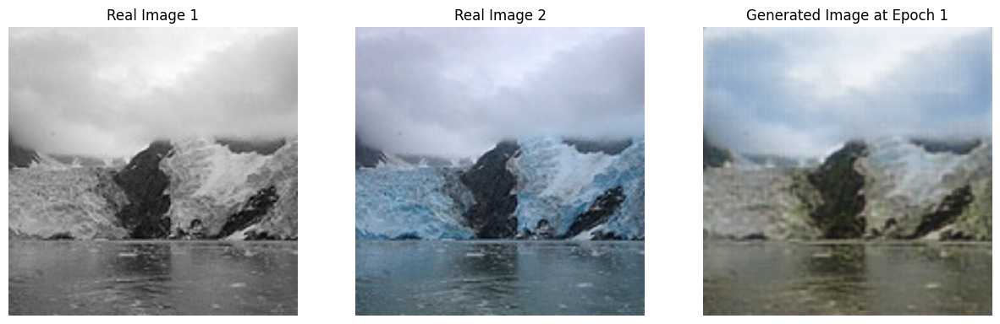

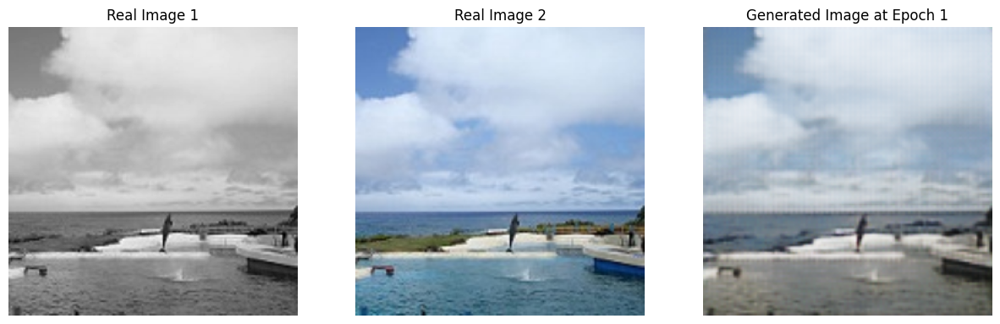

Epoch [2/35], d_loss: 1.7785, g_loss: 6.4009, val_loss: 6.8061
402.00190782546997
Epoch [3/35], d_loss: 1.8081, g_loss: 6.1610, val_loss: 6.6001
394.6292130947113
Epoch [4/35], d_loss: 1.6192, g_loss: 6.2858, val_loss: 6.1658
431.8352916240692
Epoch [5/35], d_loss: 1.4836, g_loss: 6.6448, val_loss: 6.2452
468.5032002925873


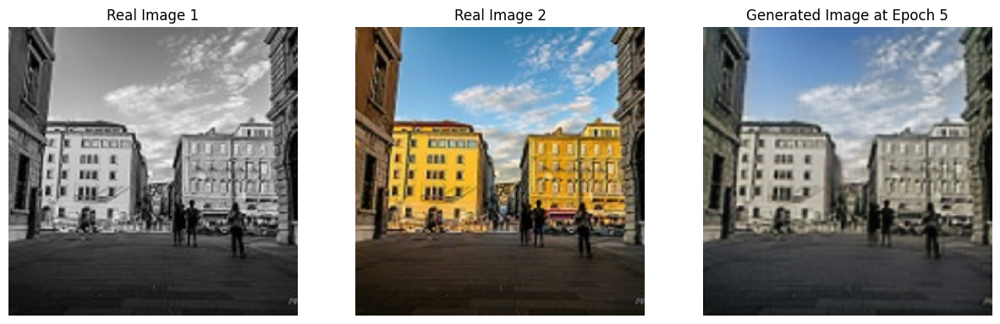

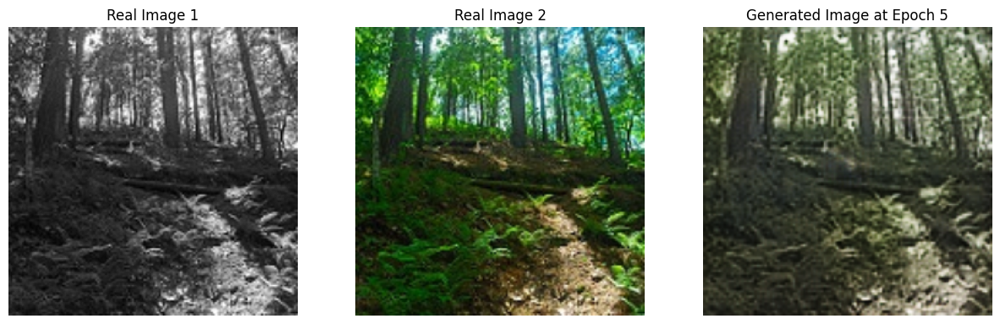

Epoch [6/35], d_loss: 1.4462, g_loss: 5.9951, val_loss: 6.2132
406.10116314888
Epoch [7/35], d_loss: 1.5308, g_loss: 6.2864, val_loss: 5.8535
390.7501847743988
Epoch [8/35], d_loss: 1.5317, g_loss: 6.3286, val_loss: 5.7475
436.2676920890808
Epoch [9/35], d_loss: 1.4677, g_loss: 4.6733, val_loss: 5.8888
404.2075045108795
Epoch [10/35], d_loss: 1.4560, g_loss: 5.1826, val_loss: 5.7582
391.2537887096405


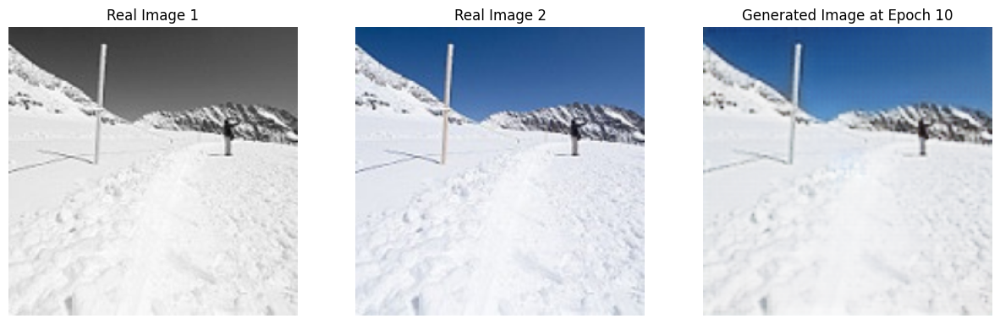

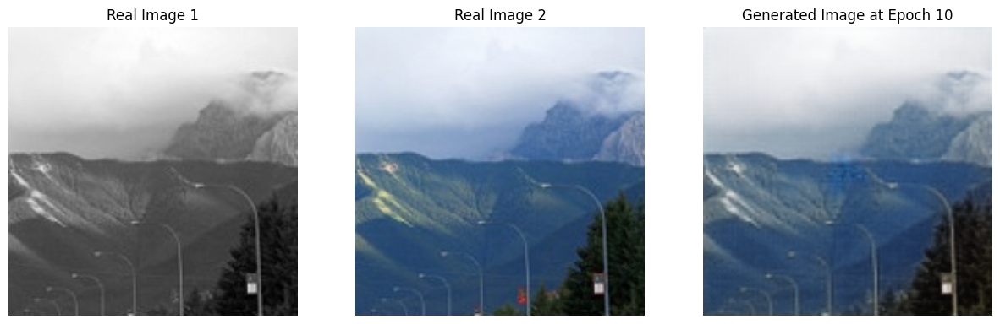

Epoch [11/35], d_loss: 1.4229, g_loss: 6.0253, val_loss: 5.6793
402.6906280517578
Epoch [12/35], d_loss: 1.4250, g_loss: 5.2256, val_loss: 5.6520
420.1392254829407
Epoch [13/35], d_loss: 1.4137, g_loss: 5.1333, val_loss: 5.5662
451.6272373199463
Epoch [14/35], d_loss: 1.3894, g_loss: 5.6269, val_loss: 5.5001
1699.6545178890228
Epoch [15/35], d_loss: 1.4175, g_loss: 5.5037, val_loss: 5.4217
724.9548914432526


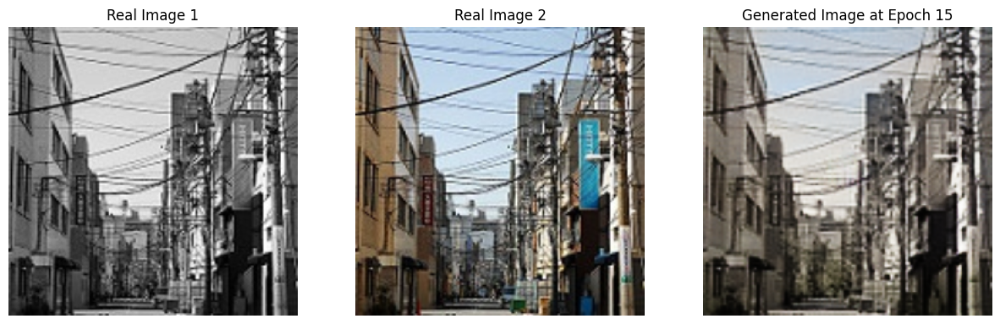

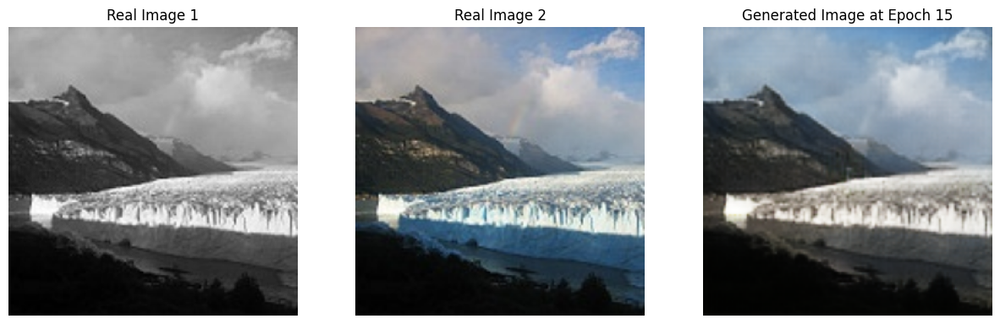

Epoch [16/35], d_loss: 1.3923, g_loss: 5.7836, val_loss: 5.4290
540.6013748645782
Epoch [17/35], d_loss: 1.3916, g_loss: 5.5286, val_loss: 5.5399
492.42662286758423
Epoch [18/35], d_loss: 1.4205, g_loss: 5.0992, val_loss: 5.5514
562.7861337661743
Epoch [19/35], d_loss: 1.3835, g_loss: 6.8618, val_loss: 5.4883
590.2842559814453
Epoch [20/35], d_loss: 1.3975, g_loss: 5.8405, val_loss: 5.2948
591.2768447399139


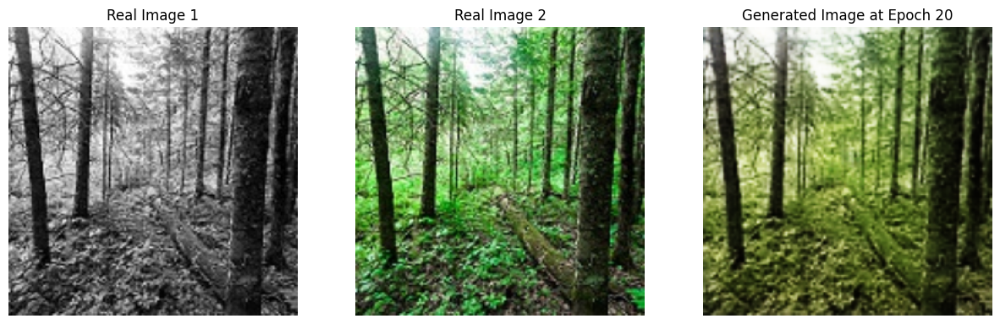

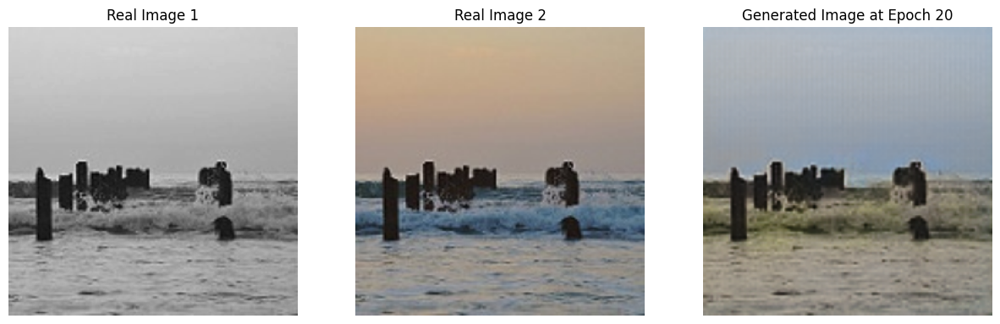

Epoch [21/35], d_loss: 1.4036, g_loss: 4.9785, val_loss: 5.3229
590.6547651290894
Epoch [22/35], d_loss: 1.4252, g_loss: 4.1260, val_loss: 5.3294
576.3558440208435
Epoch [23/35], d_loss: 1.4033, g_loss: 4.8661, val_loss: 5.2817
571.8372800350189
Epoch [24/35], d_loss: 1.3705, g_loss: 5.9330, val_loss: 5.2424
567.8239738941193
Epoch [25/35], d_loss: 1.3963, g_loss: 5.5234, val_loss: 5.3335
529.5848340988159


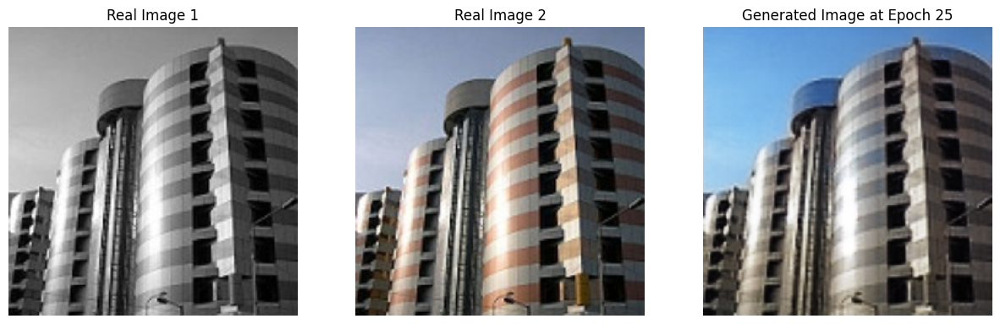

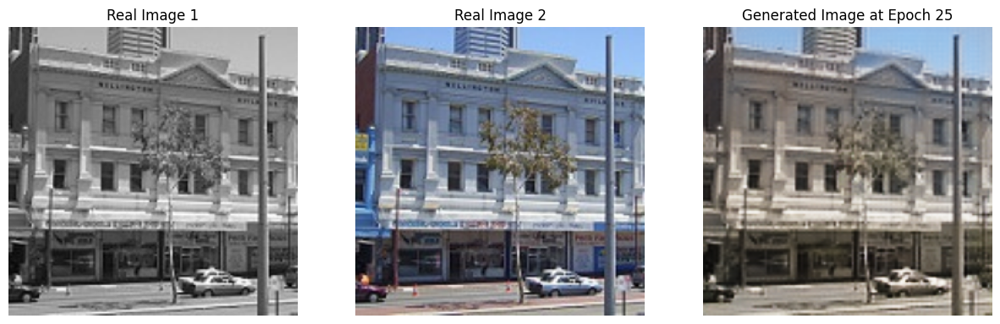

Epoch [26/35], d_loss: 1.4032, g_loss: 4.8369, val_loss: 5.3232
529.7420132160187
Epoch [27/35], d_loss: 1.3913, g_loss: 5.3531, val_loss: 5.3368
528.5256407260895
Epoch [28/35], d_loss: 1.3868, g_loss: 4.8365, val_loss: 5.3319
528.0839676856995
Epoch [29/35], d_loss: 1.3873, g_loss: 4.8912, val_loss: 5.2871
526.9612708091736
Epoch [30/35], d_loss: 1.3653, g_loss: 5.2597, val_loss: 5.2488
530.5800051689148


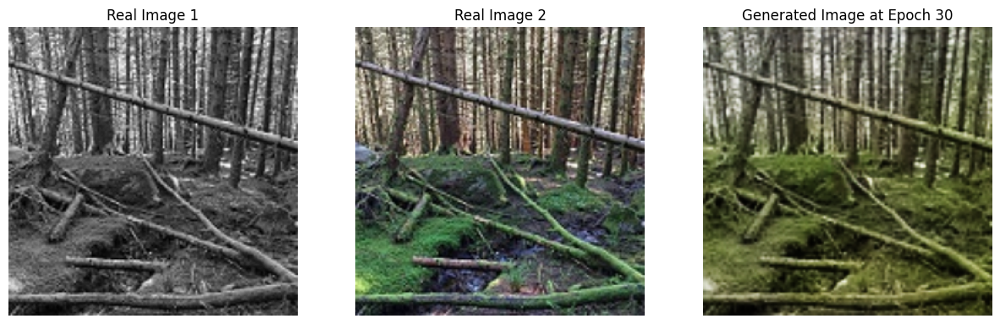

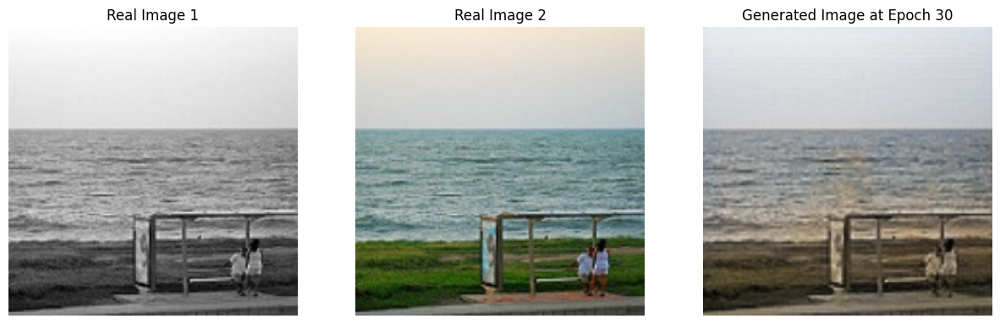

Epoch [31/35], d_loss: 1.3988, g_loss: 4.8051, val_loss: 5.2828
548.8919327259064
Epoch [32/35], d_loss: 1.3939, g_loss: 4.6974, val_loss: 5.4146
572.9037725925446
Epoch [33/35], d_loss: 1.3850, g_loss: 4.5043, val_loss: 5.3859
572.0298256874084
Epoch [34/35], d_loss: 1.3727, g_loss: 5.1869, val_loss: 5.3013
584.2445025444031
Epoch [35/35], d_loss: 1.3716, g_loss: 5.1080, val_loss: 5.3697
578.0766310691833


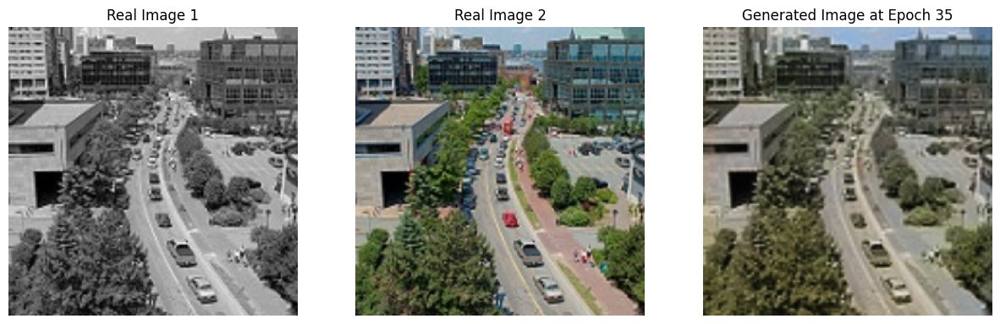

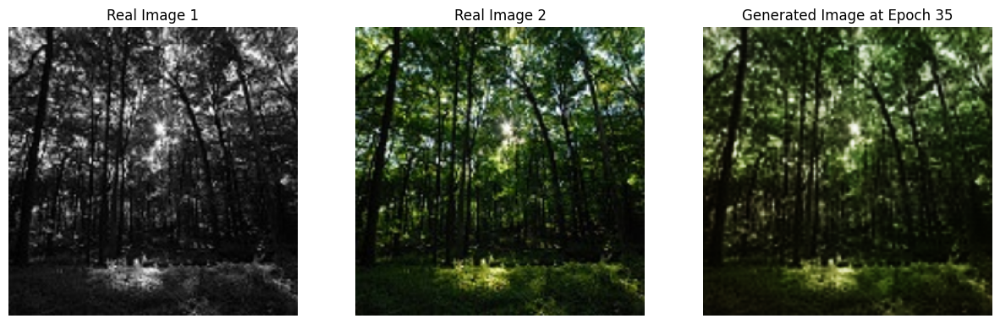

Treinamento concluído!


In [23]:
from matplotlib import pyplot as plt

# Instanciando o modelo GAN
gan = PaisagemGAN(generator=gene, discriminator=disc)
gan = gan.to(device)
gan.compile(g_loss=g_loss, d_loss=d_loss)

# Número de épocas
num_epochs = 35


# Loop de treinamento
print("Iniciar treinamento")
g_losses = []
d_losses = []
val_losses = []
for epoch in range(num_epochs):
    i = 0
    inicio = time.time()
    train_g_loss = 0.0
    train_d_loss = 0.0
    for batch in train_loader:
        real_images = normalize(batch[1].to(device))
        grey_images = normalize(batch[0].to(device))
        loss = gan.train_step(real_images, grey_images)
        i += 1
        train_g_loss += loss['g_loss']
        train_d_loss += loss['d_loss']
        real_images.cpu()
        grey_images.cpu()
    g_losses.append(train_g_loss/len(train_loader))
    d_losses.append(train_d_loss/len(train_loader))
    
    # Avaliação no conjunto de validação
    val_loss = 0.0
    with torch.no_grad():
        for val_batch in val_loader:
            val_real_images = normalize(val_batch[1].to(device))
            val_grey_images = normalize(val_batch[0].to(device))
            val_fake_images = gan.generator(val_grey_images)
            val_yhat_fake = gan.discriminator(val_fake_images)
            last_v_loss = g_loss(val_yhat_fake, val_fake_images, val_real_images)
            val_loss += last_v_loss.item()
            val_real_images.cpu()
            val_grey_images.cpu()
    
    val_loss /= len(val_loader)
    val_losses.append(val_loss)
    
    print(f"Epoch [{epoch+1}/{num_epochs}], d_loss: {loss['d_loss']:.4f}, g_loss: {loss['g_loss']:.4f}, val_loss: {val_loss:.4f}")
    fim = time.time()
    print(fim - inicio)

    if (epoch+1) % 5 == 0 or (epoch) == 0:
        save_checkpoint(gan.generator, gan.g_opt, epoch, batch, loss, filepath='/kaggle/working/gen.pth')
        save_checkpoint(gan.discriminator, gan.d_opt, epoch, batch, loss, filepath='/kaggle/working/disc.pth')

        # Desenhando evoluçao do treinamento
        # Convertendo as imagens geradas de 0-1 para 0-255
        gen_image = (loss['gen'][0].detach().cpu().numpy().transpose(1, 2, 0) * 255).astype('uint8')

        # Convertendo batch[0] e batch[1] de 0-1 para 0-255
        real_image1 = (batch[0][0].detach().cpu().numpy().squeeze()*255).astype('uint8')
        real_image2 = (batch[1][0].detach().cpu().numpy().transpose(1, 2, 0)*255 ).astype('uint8')

        # Plotando as três imagens lado a lado
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))

        axes[0].imshow(real_image1, cmap='gray')
        axes[0].set_title("Real Image 1")

        axes[1].imshow(real_image2)
        axes[1].set_title("Real Image 2")

        axes[2].imshow(gen_image)
        axes[2].set_title(f"Generated Image at Epoch {epoch + 1}")

        for ax in axes:
            ax.axis('off')  # Remove os eixos

        plt.show()

        # Desenhando evolução da validação
        # Convertendo as imagens geradas de 0-1 para 0-255
        gen_image = (val_fake_images[0].detach().cpu().numpy().transpose(1, 2, 0) * 255).astype('uint8')

        # Convertendo batch[0] e batch[1] de 0-1 para 0-255
        real_image1 = (val_grey_images[0].detach().cpu().numpy().squeeze()*255).astype('uint8')
        real_image2 = (val_real_images[0].detach().cpu().numpy().transpose(1, 2, 0)*255 ).astype('uint8')

        # Plotando as três imagens lado a lado
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))

        axes[0].imshow(real_image1, cmap='gray')
        axes[0].set_title("Real Image 1")

        axes[1].imshow(real_image2)
        axes[1].set_title("Real Image 2")

        axes[2].imshow(gen_image)
        axes[2].set_title(f"Generated Image at Epoch {epoch + 1}")

        for ax in axes:
            ax.axis('off')

        plt.show()
        

print("Treinamento concluído!")


In [24]:
#torch.cuda.empty_cache()
print(val_losses)

[6.792853689905423, 6.806056841095882, 6.600069914291154, 6.16581210805409, 6.245157391277711, 6.213242566407616, 5.853491491346217, 5.747477253871177, 5.888781803757397, 5.758228835774891, 5.679346874578675, 5.651988883516681, 5.566205174175661, 5.500111117291806, 5.421683524971578, 5.429029365084064, 5.539899171288334, 5.551376335656465, 5.488260987979262, 5.294792709065907, 5.322926300675122, 5.329355353739724, 5.281735989584852, 5.242409044237279, 5.333527258972623, 5.323207912160389, 5.3368173570775275, 5.331903436290684, 5.2870711995594535, 5.248768578714399, 5.282768833103464, 5.414646291021091, 5.385851048711521, 5.301334722718196, 5.369701428199882]


In [28]:
import csv

# Caminho do arquivo onde as perdas serão salvas
loss_file_path = 'losses_sgd.csv'

# Função para salvar as perdas em um arquivo CSV
def save_losses_to_csv(g_losses, d_losses, val_losses, file_path):
    with open(file_path, mode='w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(['Epoch', 'G Loss', 'D Loss', 'Validation Loss'])
        for epoch, (g, d, val_loss) in enumerate(zip(g_losses, d_losses, val_losses), start=1):
            writer.writerow([epoch, g, d, val_loss])

# Salvar as perdas
save_losses_to_csv(g_losses, d_losses, val_losses, loss_file_path)

print(f"Losses saved to {loss_file_path}")

Losses saved to losses_sgd.csv


In [26]:
# Caminho para a pasta de teste
test_color_dir = "/kaggle/input/test-color10"
test_gray_dir = "/kaggle/working/test_gray10"
os.makedirs(test_gray_dir, exist_ok=True)

# Listar imagens de teste
test_color_images = sorted(os.listdir(test_color_dir))

# Função para converter e salvar imagens em escala de cinza
def convert_to_grayscale_and_save(image_path, save_dir):
    image = Image.open(image_path).convert("L")  # Converte para escala de cinza
    base_name = os.path.basename(image_path)
    save_path = os.path.join(save_dir, base_name)
    image.save(save_path)

# Converter e salvar todas as imagens coloridas como monocromáticas
for img_name in test_color_images:
    img_path = os.path.join(test_color_dir, img_name)
    convert_to_grayscale_and_save(img_path, test_gray_dir)

print("Imagens monocromáticas geradas e salvas com sucesso!")

FileNotFoundError: [WinError 3] O sistema não pode encontrar o caminho especificado: '/kaggle/input/test-color10'

torch.Size([1, 1, 128, 128])


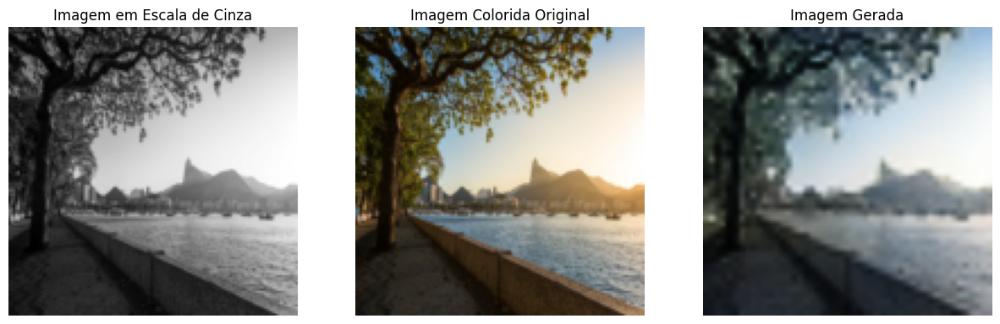

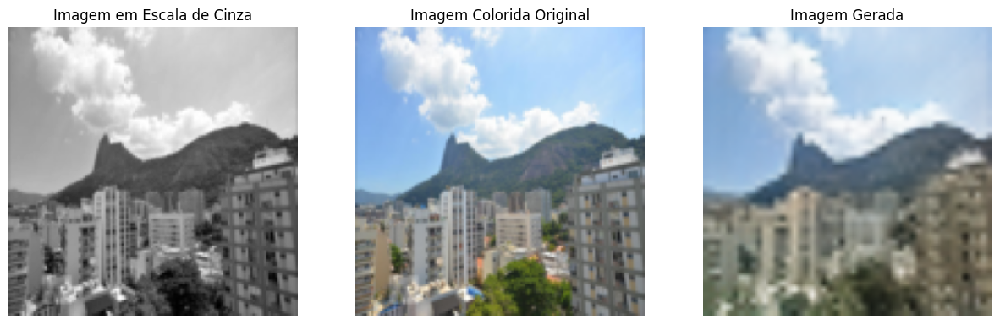

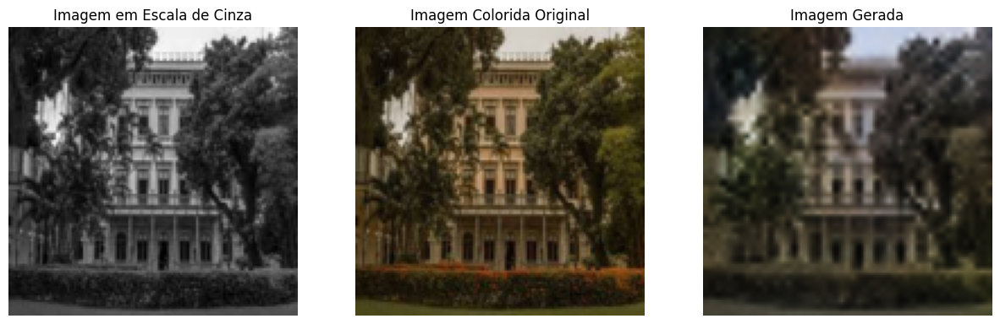

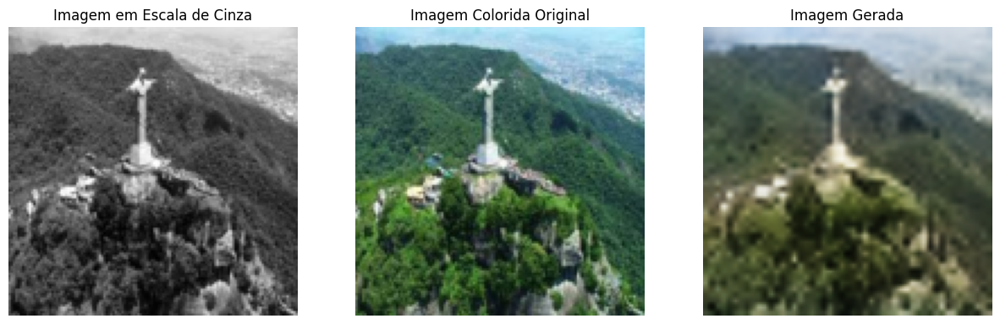

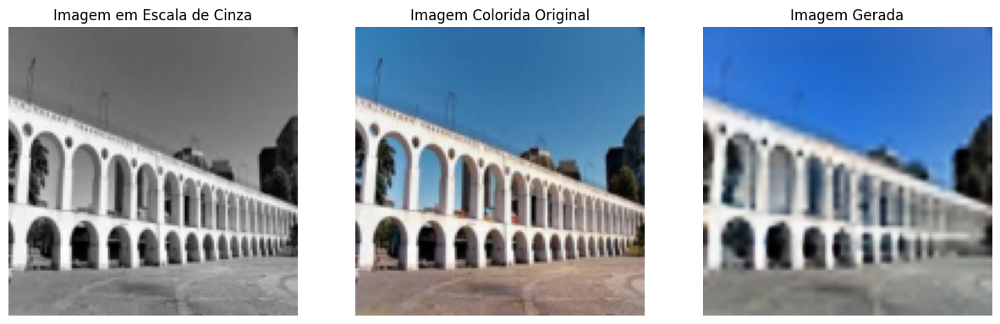

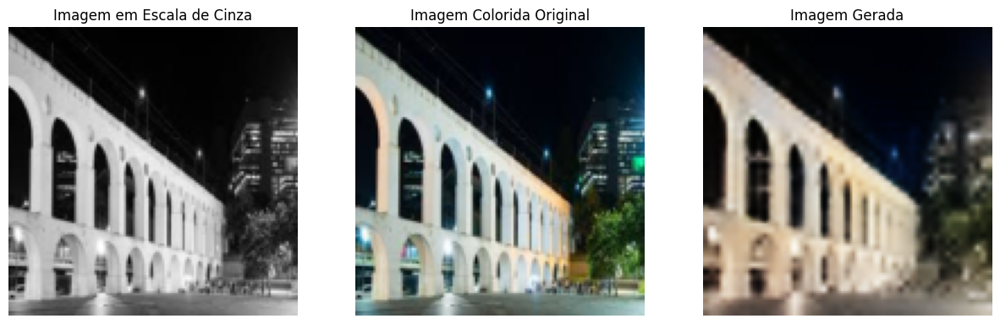

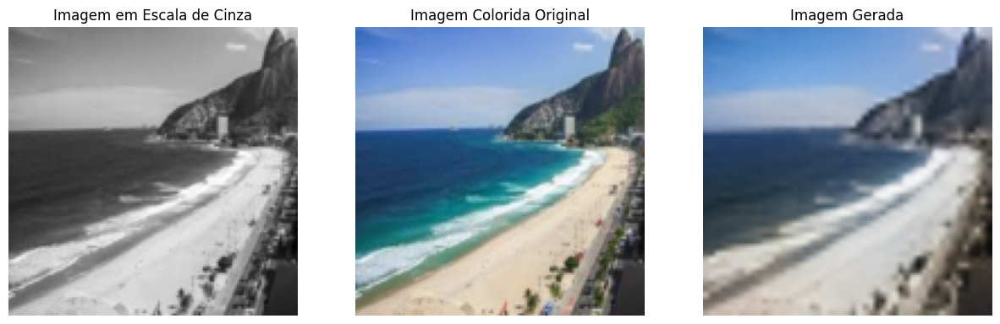

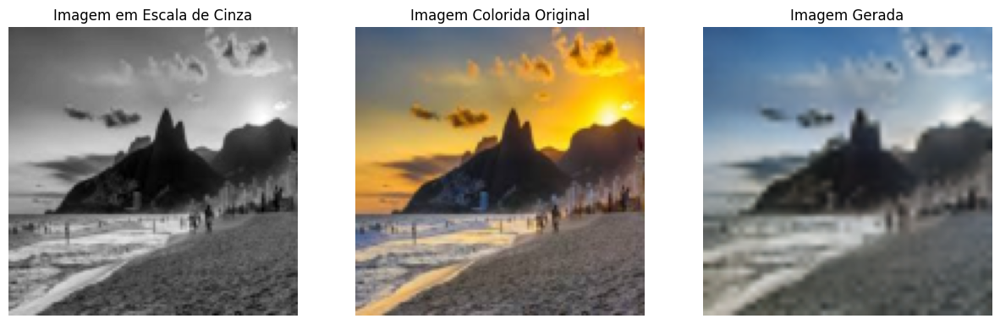

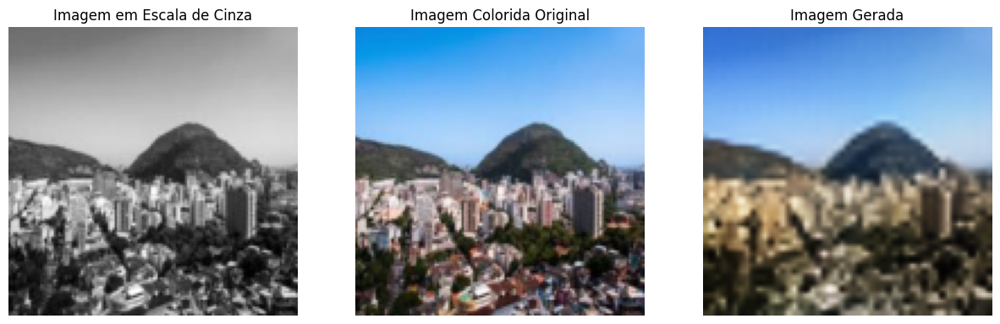

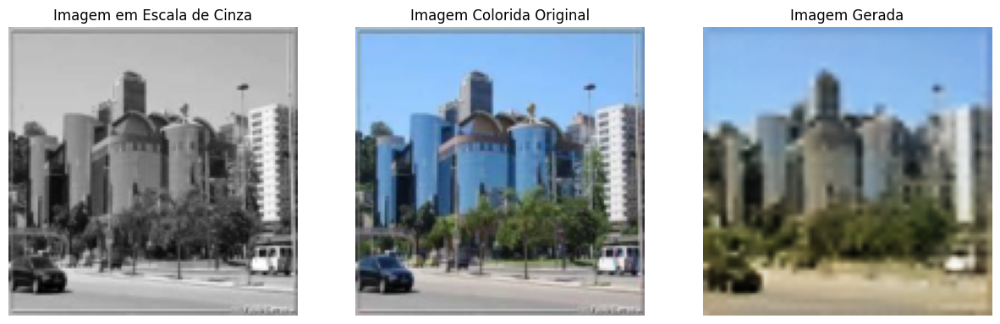

In [19]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

# Definir o dispositivo (GPU se disponível, caso contrário, CPU)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Definir o dataset customizado que converte a imagem colorida para cinza diretamente
class CustomDataset(Dataset):
    def __init__(self, gray_dir, color_dir, image_names, transform=None):
        self.color_dir = color_dir
        self.image_names = image_names
        self.transform = transform

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, idx):
        image_name = self.image_names[idx]
        # Caminho para a imagem colorida
        color_image_path = os.path.join(self.color_dir, image_name + '.jpeg')

        # Carregar a imagem colorida e convertê-la para cinza
        color_image = Image.open(color_image_path).convert('RGB')
        gray_image = color_image.convert('L')  # Converte para escala de cinza

        # Aplicar as transformações
        if self.transform:
            gray_image = self.transform(gray_image)
            color_image = self.transform(color_image)

        return gray_image, color_image

# Definir as transformações de pré-processamento
transform = transforms.Compose([
    transforms.Resize((128, 128)),  # Tamanho da imagem esperado
    transforms.ToTensor(),  # Converte a imagem para tensor
])

# Caminho para a pasta de teste
test_color_dir = "/kaggle/input/test-color10"

# Listar imagens de teste
test_color_images = sorted(os.listdir(test_color_dir))

# Extraindo nomes dos arquivos (sem a extensão)
test_image_names = [os.path.splitext(img)[0] for img in test_color_images]

# Criando dataset de teste
test_dataset = CustomDataset(None, test_color_dir, test_image_names, transform=transform)

# Criando DataLoader de teste
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=4, pin_memory=True)

# Pegar as dimensões de uma amostra de imagem
nex = next(iter(test_loader))
img_dim = nex[0].shape
print(img_dim)

# Mover o gerador para o dispositivo (GPU ou CPU)
generator = gene.to(device)

# Colocar o gerador no modo de avaliação (para desativar dropout e batchnorm)
generator.eval()

# Gerar novas imagens e exibir os resultados
for gray_image, color_image in test_loader:
    # Mover a imagem em escala de cinza para o dispositivo (GPU ou CPU)
    gray_image = gray_image.to(device)

    with torch.no_grad():  # Desativa o cálculo do gradiente para a inferência
        generated_image = generator(gray_image)

    # Pós-processamento (se necessário)
    generated_image = generated_image.squeeze(0)  # Remove a dimensão de lote
    #generated_image = (generated_image * 0.5) + 0.5  # Desfaz a normalização [-1, 1] -> [0, 1]
    generated_image = generated_image.cpu().numpy().transpose(1, 2, 0)  # Converte para numpy e rearranja dimensões
    generated_image = (generated_image * 255).astype('uint8')  # Reescala para [0, 255] e converte para uint8


    # Exibir as imagens (gray_image, color_image, generated_image)
    plt.figure(figsize=(15, 5))

    # Mostrar a imagem em escala de cinza
    plt.subplot(1, 3, 1)
    plt.imshow(gray_image.squeeze().cpu(), cmap='gray')  # Remover a dimensão extra
    plt.title('Imagem em Escala de Cinza')
    plt.axis('off')

    # Mostrar a imagem colorida original
    plt.subplot(1, 3, 2)
    plt.imshow(color_image.squeeze(0).permute(1, 2, 0).cpu())  # Corrigir permutação para (H, W, C)
    plt.title('Imagem Colorida Original')
    plt.axis('off')

    # Mostrar a imagem gerada
    plt.subplot(1, 3, 3)
    plt.imshow(generated_image)
    plt.title('Imagem Gerada')
    plt.axis('off')

    plt.show()
